In [1]:
#import packages
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt 



In [2]:
# Import customer list
u_df=pd.read_csv('./data/Users_sanitized.csv', sep=',', index_col='UserId')
u_df.head()

,Unnamed: 0,CreationTimestamp,ClaimType,IsOfflineUser
UserId,,,,
eecc280c-9941-41bc-b26f-d519da794a5d,0,1970-01-01 00:00:00+00,consumer,False
d9d8a373-29f0-4fe5-8f17-39669083ac48,1,1970-01-01 00:00:00+00,consumer,True
8f27c773-334a-4f8c-82c2-8cdec215a9bb,2,1970-01-01 00:00:00+00,consumer,True
aefe87c8-f537-4bdc-954f-6833a047081b,3,1970-01-01 00:00:00+00,consumer,True
6ad98c4e-18e3-4a6e-ac94-1338cb239c2d,4,1970-01-01 00:00:00+00,consumer,True


In [3]:
# Import container list
c_df=pd.read_csv('./data/Containerlist.csv', sep=',', index_col='Id')
c_df.head()

,Name,TypeId,CreatedById,ShortId
Id,,,,
00004f6b-e416-4a86-91df-5d177520d3a0,Marinha Grande,1,cb73faf3-410a-4e71-83cb-c303efeaeba8,61CQAR
00005175-379b-458a-9740-7741814674e4,Dayton,1,fd3ec806-b763-48a9-992b-09e50c8a274c,NaN
0000bbe4-2051-4c32-850f-220288b868a6,Nahal,6,NaN,NaN
0000c7c3-8f3c-4eb2-b586-dcae82555d16,Winfred F.,1,cb73faf3-410a-4e71-83cb-c303efeaeba8,Z9HBTP
0000f63c-9747-4c15-871f-f011198c8f88,Billy Wilder,3,fd3ec806-b763-48a9-992b-09e50c8a274c,NaN


In [4]:
# Size of df
print(c_df.shape)

c_df.TypeId.unique()

#c_df.Name.unique()


(431444, 4)


array([ 1,  6,  3,  2, 10, 12,  8,  5,  4,  7,  9, 13, 11, 15])

In [5]:
# Import container typs
c_type_df=pd.read_csv('./data/ContainerTypes.csv', sep=',', index_col='Id')
print(c_type_df.shape)
c_type_df.head()

(16, 4)


,Name,Description,CategoryId,IsWhiteLabel
Id,,,,
1,1250ml Bowl,A standard bowl,1.0,False
2,500ml Bowl,A smaller Bowl,1.0,False
3,750ml Bowl,A medium bowl,1.0,False
4,Sushibox,A box for sushi,1.0,False
5,Cup,A reusable cocktail glass,1.0,False


In [6]:
# Import merchants
m_df=pd.read_csv('./data/MerchantInfos.csv', sep=',', index_col='Id')
m_df.head()


,MerchantId,Name,Longitude,Latitude,CreationDate,CategoryId,SellsOfflineCards,StreetAddress,ZipCode,City,Country,CanGetBowl,CanPreorder,IsPublished,ShowInStats
Id,,,,,,,,,,,,,,,
83787f7a-b659-44b6-a8aa-d1ef5b958a65,ed2c2eea-8399-4779-a9ea-dafb77878965,SAP WDF49 - Food Factory,8.642271,49.292543,2021-06-28 11:56:10.812661,4,False,Dietmar-Hopp-Allee 17,69190,Walldorf,NaN,True,False,True,True
4cd61f39-ddce-449f-8d1a-ef95c7b25307,cc8b8b51-efd7-4d74-84c8-4721619867df,Guten Dag,13.413539,52.548254,2020-07-14 19:44:49.101383,2,False,Schönhauser Allee 120,10437,Berlin,DE,False,True,True,True
fa17e91f-cdfb-4912-81c9-92cd0b87328e,78ecc5a3-0ea0-4820-9fd2-637c95d73782,Gasthaus Brückenschänke,7.771990,49.943655,2021-01-20 10:25:12.831661,2,False,Staatsstraße 4,55442,Stromberg,NaN,True,False,True,True
7c376406-7a5b-4a6c-b22c-e7e02ae0080c,f9b37c73-3a67-47b3-82cd-cfd1d6fafd6a,Com A,13.422482,52.500293,2020-08-26 06:53:57.107271,2,False,Oranienstraße 191,10999,Berlin,NaN,True,False,True,True
f421a5f6-ba67-4336-afc3-021a04da5005,556becfc-1aac-43e2-87d9-cbc3fab0f4b0,BLE - Betriebsgastronomie,7.184823,50.672743,2020-10-01 09:33:59.032472,4,False,Deichmanns Aue 29,53179,Bonn,NaN,True,False,False,True


In [7]:
m_df.groupby(by='MerchantId').size().sort_values()

MerchantId
fff28426-5a3f-4e99-9d50-1787b8e31b54     1
9a48c5a5-5f06-4274-b1e6-4bc25943a8cf     1
9a43fa7f-ba16-4cad-8dea-804a8d8a17a2     1
9a142832-9161-4249-94be-a9e42dc7fa83     1
9a0f7966-2e33-44a1-8c63-fc50f53b75ee     1
                                        ..
f66c97a1-6e67-49a1-889d-fa75aeae356b    14
e97abc44-89c7-4771-952b-b3dab56625c3    15
ed2c2eea-8399-4779-a9ea-dafb77878965    16
3afdaa57-ecc2-4c79-94a3-d10700a299b0    22
6fde0c68-6c47-4183-b725-c5de30f90f02    25
Length: 1720, dtype: int64

In [8]:
import folium

map_osm = folium.Map(location=[50, 5],zoom_start=5)
for ind, row in m_df.iterrows():
    folium.CircleMarker(location=[row["Latitude"], row["Longitude"]],radius=2, popup=ind).add_to(map_osm)
map_osm

### 

In [9]:
# Import regions
r_df=pd.read_csv('./data/Regions.csv', sep=',', index_col='Id')
r_df.head()

,Name
Id,
0,No Region
1,01_R01_Munich (BY)
2,01_R02_Stuttgart (BW)
3,"01_R03_Frankfurt (HE, SL)"
4,"01_R04_Cologne (NRW_South, RP)"


In [10]:
# import transactions
in_df=pd.read_csv('./data/Total Checkins.csv', sep=',')
in_df.head()


#in_df.info()

in_df['OwnerSince']= pd.to_datetime(in_df['OwnerSince'])
in_df['OwnerTill']= pd.to_datetime(in_df['OwnerTill'])

print(in_df.info())


#fi_df =in_df.loc[in_df["OwnerTill"].between('2021-08-1', '2021-08-31')].copy()
#del in_df
#print(fi_df.shape)
#fi_df.head()
in_df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1659399 entries, 0 to 1659398
Data columns (total 11 columns):
 #   Column              Non-Null Count    Dtype              
---  ------              --------------    -----              
 0   Unnamed: 0          1659399 non-null  int64              
 1   UserId              1659399 non-null  object             
 2   ExternalPickpackId  1446039 non-null  object             
 3   StoreId             1659399 non-null  object             
 4   StoreName           1659399 non-null  object             
 5   LocationId          1659399 non-null  int64              
 6   TransactionId       1644876 non-null  object             
 7   OwnerSince          1659399 non-null  datetime64[ns, UTC]
 8   OwnerTill           1659399 non-null  datetime64[ns, UTC]
 9   ContainerId         1659399 non-null  object             
 10  ContainerType       1659399 non-null  object             
dtypes: datetime64[ns, UTC](2), int64(2), object(7)
memory usage: 13

,Unnamed: 0,UserId,ExternalPickpackId,StoreId,StoreName,LocationId,TransactionId,OwnerSince,OwnerTill,ContainerId,ContainerType
0,0,3847d24c-7b3c-4908-81cd-11cd9f4b1d37,vytal_bYZ2emJy7RASNN,26b1bd7b-c684-4cb9-aa76-51cc94b4df70,Salam Box,3866638,ee2b5aa8-9aad-447d-a8a2-66258acb18d8,2021-09-04 11:12:20.545771+00:00,2021-09-06 14:37:49.963400+00:00,3347515e-eb3f-43ab-a55b-ab019c3b6997,1250ml Bowl
1,1,3847d24c-7b3c-4908-81cd-11cd9f4b1d37,vytal_bYZ2emJy7RASNN,26b1bd7b-c684-4cb9-aa76-51cc94b4df70,Salam Box,3866637,ee2b5aa8-9aad-447d-a8a2-66258acb18d8,2021-09-04 11:12:20.545771+00:00,2021-09-06 14:37:49.963400+00:00,919d2868-f154-46be-93c0-7f548d4416f0,1250ml Bowl
2,2,28421d4c-5213-44e5-a832-49f0b28c0e2a,vytal_q6VAEDli9i6zEK,afcd3cf4-bf64-4217-b192-6359fac0679a,Tiki Poke Bowl,3727671,f5afaa79-a767-4991-9c9d-1a5a4deed74c,2021-08-25 10:01:09.920476+00:00,2021-09-06 14:36:28.413267+00:00,aa5a5efa-4a96-4990-8f4b-f1fb96f0423f,Compartment Bowl
3,3,28421d4c-5213-44e5-a832-49f0b28c0e2a,vytal_q6VAEDli9i6zEK,afcd3cf4-bf64-4217-b192-6359fac0679a,Tiki Poke Bowl,3727670,f5afaa79-a767-4991-9c9d-1a5a4deed74c,2021-08-25 10:01:09.920476+00:00,2021-09-06 14:36:28.413267+00:00,175bde34-9e9b-4c39-8201-4953574688bd,1250ml Bowl
4,4,1fdf3e5c-7072-4c6e-b7ca-4c2bc53abb98,vytal_Uo1hXokqOiOz2F,825df884-f2cd-4c89-bf27-b63042035435,WDR Arkaden - Betriebskantine,3885031,f0294ada-73d6-430c-bad3-42a1e5ae66e7,2021-09-06 12:41:06.868894+00:00,2021-09-06 14:31:28.996050+00:00,5c9ed900-7098-42d1-a60e-428c97ded2c5,750ml Bowl


In [11]:
in_df['TransactionId'].is_unique


False

In [12]:
in_df.groupby(by='TransactionId').size().sort_values(ascending=False).head(20)

TransactionId
49e518fb-7e24-4c51-843e-4b21dc591dd9    127
5944763c-a9e5-4658-9806-5af868b66d04    111
1e7e5067-113e-4703-9539-8199eed3854c    105
61148594-b72e-42d5-b8cf-739de3e94075     99
a73401d0-aa31-4ec3-89fb-a40a31c48aee     98
018a63a9-a01a-4e33-a73b-ba9b0624f639     93
92ded3d2-f080-4118-936f-4d61d3f6727f     92
98235c45-f2a3-4b10-8b5c-043bf496fdfc     91
2127aadf-ae08-4641-b2ed-8666e1c58c66     91
466f2df0-e126-47bb-a2b0-8be19499f6ef     91
f3c77c09-88d2-473f-9631-a67ca93dfa38     90
b8bc8906-393f-4191-bc4a-6cdeaf62f9ef     89
32ce46f5-cd1e-404a-b690-ae99de92d13b     89
da99a426-90cc-413a-beae-15b3db2781c1     89
6c7c1ec7-774d-4904-85b3-e1603dbff039     88
046c34df-38df-4bac-b77d-1eaeec994025     88
ce5d7168-241f-4567-aa4e-4a5f8114fcd1     88
020a5edc-3037-4134-947a-0ac623f00015     87
9e64831b-926d-4133-a43e-53e67563891b     87
2caaaef6-83ef-4cca-9902-b7ba1f3f2b0a     86
dtype: int64

In [13]:
out_df=pd.read_csv('./data/Total Checkout.csv', sep=',')
out_df['OwnerSince']= pd.to_datetime(out_df['OwnerSince'])
out_df['OwnerTill']= pd.to_datetime(out_df['OwnerTill'])

#fo_df =out_df.loc[out_df["OwnerTill"].between('2021-08-1', '2021-08-31')].copy()
#del out_df
#print(fo_df.shape)
out_df.head()


/Users/kultiginbozdemir/opt/anaconda3/envs/CO2/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3147: DtypeWarning: Columns (6,10) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Unnamed: 0,UserId,ExternalPickpackId,StoreId,StoreName,LocationId,TransactionId,OwnerSince,OwnerTill,ContainerId,DeliveryTokenId,ContainerType
0,0,db70348b-76ae-4bff-b3ef-c1c727cc3be7,vytal_yjCP6j0bbUVAu0,e6e6d4e5-56dd-4361-8ebd-ebdd865f41ea,Mashery Hummus Kitchen,63672,NaN,2020-09-01 18:25:20.296746+00:00,2020-09-01 18:25:20.296746+00:00,4a9a935d-2260-4cfb-9bad-9751e48291a0,NaN,1250ml Bowl
1,1,66c1e632-a6d1-4203-bc6a-2b4c8e669e92,vytal_OwGu7ZOXba3jbu,e78d649c-7ced-4e07-95d0-8a25c58e1bc9,Krua Thai (Belgisches Viertel),63666,NaN,2020-09-01 18:14:25.942667+00:00,2020-09-01 18:14:25.942667+00:00,7f161610-c775-406f-a67c-95d322b463f6,NaN,1250ml Bowl
2,2,66c1e632-a6d1-4203-bc6a-2b4c8e669e92,vytal_OwGu7ZOXba3jbu,e78d649c-7ced-4e07-95d0-8a25c58e1bc9,Krua Thai (Belgisches Viertel),63664,NaN,2020-09-01 18:14:25.285038+00:00,2020-09-01 18:14:25.285038+00:00,68ea4bb3-0465-4209-a4cd-e6c03b394f7f,NaN,500ml Bowl
3,3,c525dce1-af31-4628-b4e9-c73901bf12d6,vytal_dpJU8pmvYzdV5e,c0a21089-3449-4744-b080-a8c7055718e2,Saigonese Kitchen,63657,NaN,2020-09-01 18:13:51.972676+00:00,2020-09-01 18:13:51.972676+00:00,eff44578-fe90-4045-ad49-6efc42c72a6e,NaN,750ml Bowl
4,4,c525dce1-af31-4628-b4e9-c73901bf12d6,vytal_dpJU8pmvYzdV5e,c0a21089-3449-4744-b080-a8c7055718e2,Saigonese Kitchen,63659,NaN,2020-09-01 18:13:51.972676+00:00,2020-09-01 18:13:51.972676+00:00,fa898324-f79e-42b2-86ef-4323d74e80c6,NaN,750ml Bowl


In [14]:
out_df.groupby(by='TransactionId').size().sort_values(ascending=False).head(9000).tail(3)

TransactionId
60f6ca1f-8070-4c04-ba46-a36fd03873d5    16
60dc616f-536b-47f9-8527-105e59e16155    16
01c67a73-e52b-400f-9dcc-0059799ddfe7    16
dtype: int64

In [15]:
out_df[out_df['TransactionId']=='01c67a73-e52b-400f-9dcc-0059799ddfe7']

,Unnamed: 0,UserId,ExternalPickpackId,StoreId,StoreName,LocationId,TransactionId,OwnerSince,OwnerTill,ContainerId,DeliveryTokenId,ContainerType
319009,319009,54b0cd36-eb71-4dd4-8cb2-89fc9f28031f,vytal_lNQs7SfBmx5t92,ee26f9ab-62fb-4af4-bdf9-8681d6109b49,Jaegers FeineKost,1626721,01c67a73-e52b-400f-9dcc-0059799ddfe7,2021-04-09 11:48:49.452363+00:00,2021-04-28 17:27:01.374037+00:00,2369862e-84a4-41ac-bf76-269aed9edcaa,NaN,1250ml Bowl
334678,334678,2e73982b-a048-489e-aadc-8527725dd2f3,vytal_zKcUsAA74YPBYM,ee26f9ab-62fb-4af4-bdf9-8681d6109b49,Jaegers FeineKost,1626716,01c67a73-e52b-400f-9dcc-0059799ddfe7,2021-04-09 11:48:49.452363+00:00,2021-04-27 10:35:25.529667+00:00,a5973bfc-bad0-41af-a79d-4ed44870e491,NaN,1250ml Bowl
359987,359987,240a2ec9-f5ae-4b6f-a5a4-123a73c1062b,vytal_rrJdR5h2Af3eKj,ee26f9ab-62fb-4af4-bdf9-8681d6109b49,Jaegers FeineKost,1626722,01c67a73-e52b-400f-9dcc-0059799ddfe7,2021-04-09 11:48:49.452363+00:00,2021-04-23 11:44:39.300742+00:00,b2e10ada-9058-49e1-aee9-bfaf43858f79,NaN,1250ml Bowl
360099,360099,0c053d30-90ae-48f0-9c31-60f8837a9e9f,vytal_WG4B2aYj3HJFeH,ee26f9ab-62fb-4af4-bdf9-8681d6109b49,Jaegers FeineKost,1626713,01c67a73-e52b-400f-9dcc-0059799ddfe7,2021-04-09 11:48:49.452363+00:00,2021-04-23 11:37:54.778965+00:00,1d03921f-8395-4d90-bb79-ee1b5b4ad2b9,NaN,1250ml Bowl
361066,361066,ee0331a1-c9d4-4771-9fb8-7afbd79b8616,vytal_7rlawQFeM7tVoJ,ee26f9ab-62fb-4af4-bdf9-8681d6109b49,Jaegers FeineKost,1626707,01c67a73-e52b-400f-9dcc-0059799ddfe7,2021-04-09 11:48:49.452363+00:00,2021-04-23 11:02:47.273215+00:00,bfee885f-ccb6-43ca-b872-251efcf2466c,NaN,1250ml Bowl
361067,361067,ee0331a1-c9d4-4771-9fb8-7afbd79b8616,vytal_7rlawQFeM7tVoJ,ee26f9ab-62fb-4af4-bdf9-8681d6109b49,Jaegers FeineKost,1626719,01c67a73-e52b-400f-9dcc-0059799ddfe7,2021-04-09 11:48:49.452363+00:00,2021-04-23 11:02:47.273215+00:00,6be6f986-57db-43af-90d8-495b933ca05b,NaN,1250ml Bowl
368397,368397,244400de-c5bc-41b1-90f8-e1339866f66c,vytal_Y0sCqIubq52pag,ee26f9ab-62fb-4af4-bdf9-8681d6109b49,Jaegers FeineKost,1626715,01c67a73-e52b-400f-9dcc-0059799ddfe7,2021-04-09 11:48:49.452363+00:00,2021-04-22 16:22:47.785938+00:00,28cfb0a7-ffa4-4ba9-bf20-6ebafbf91d03,NaN,1250ml Bowl
368458,368458,588e85f2-53f3-44d2-99fc-ff8c2e70d888,vytal_xa8c3rFszSLefn,ee26f9ab-62fb-4af4-bdf9-8681d6109b49,Jaegers FeineKost,1626720,01c67a73-e52b-400f-9dcc-0059799ddfe7,2021-04-09 11:48:49.452363+00:00,2021-04-22 16:16:35.210167+00:00,1fb471b5-a7ee-4f8a-9ec6-ae4bb86ca3c8,NaN,1250ml Bowl
370607,370607,7421eedd-e918-4bb6-af52-22ecd57fc081,vytal_mRrwaNp8GfJTG8,ee26f9ab-62fb-4af4-bdf9-8681d6109b49,Jaegers FeineKost,1626708,01c67a73-e52b-400f-9dcc-0059799ddfe7,2021-04-09 11:48:49.452363+00:00,2021-04-22 11:05:31.715146+00:00,edebc4ba-f459-45c1-b942-f3fe3353081f,NaN,1250ml Bowl
379653,379653,e42ffa50-b02d-4b6f-b0c9-eba4313e5f9f,vytal_BXAKI0XYFWEFYV,ee26f9ab-62fb-4af4-bdf9-8681d6109b49,Jaegers FeineKost,1626709,01c67a73-e52b-400f-9dcc-0059799ddfe7,2021-04-09 11:48:49.452363+00:00,2021-04-21 16:39:44.738365+00:00,74c97753-4ad8-4854-86c8-f8c56a132e5c,NaN,1250ml Bowl


In [16]:
import datetime as dt


date_time_str = '2021-07-27 09:25:16'
date_time_obj = dt.datetime.strptime(date_time_str, '%Y-%m-%d %H:%M:%S')


print ("The type of the date is now",  type(date_time_obj))
print ("The date is", date_time_obj)
print(date_time_obj.date())
date_=in_df['OwnerSince'].dt.date==date_time_obj.date()
container=in_df['ContainerId']=='34dd848a-ad68-4c44-a3be-31cc837523aa'
transaction_id=in_df[date_ & container]['TransactionId']
print(transaction_id)

The type of the date is now <class 'datetime.datetime'>
The date is 2021-07-27 09:25:16
2021-07-27
205248    56474312-93a9-4536-9dc7-00f8682fd2f2
Name: TransactionId, dtype: object


In [17]:
transaction=in_df['TransactionId']=='56474312-93a9-4536-9dc7-00f8682fd2f2'
in_df[transaction & date_]

,Unnamed: 0,UserId,ExternalPickpackId,StoreId,StoreName,LocationId,TransactionId,OwnerSince,OwnerTill,ContainerId,ContainerType
205248,205248,c52e9805-f43c-46dd-8d6c-486e4fb570a4,vytal_VpmREnCXmcdMXL,2f7e572f-83b9-42d7-b75e-49a40d230f0b,"Siemens Nürnberg ""Mooritz"" I Betriebsgastron...",3358488,56474312-93a9-4536-9dc7-00f8682fd2f2,2021-07-27 09:25:16.886269+00:00,2021-08-02 05:53:47.857546+00:00,34dd848a-ad68-4c44-a3be-31cc837523aa,Compartment Bowl


In [18]:
#Lets follow the journey of a container...
in_df[in_df['ContainerId']=='69d293fa-f7ce-4039-9c52-52cf03ba7ce6'].sort_values(by='OwnerSince')

,Unnamed: 0,UserId,ExternalPickpackId,StoreId,StoreName,LocationId,TransactionId,OwnerSince,OwnerTill,ContainerId,ContainerType
1450967,1450967,05c05bde-7e0b-4cd4-a4e0-63d8c020dccf,vytal_eu8NIO6agLuxOK,6d1fd649-f721-4ec4-a279-ac1176f771c9,Die Kurve,1161191,ab2203d2-094d-4fb9-9699-4f142efb5a53,2021-03-04 18:18:38.991559+00:00,2021-03-11 19:01:40.497716+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,500ml Bowl
1400781,1400781,83074cff-0ca2-4e19-a625-2338a420ea88,vytal_nLFwx3UJxIUNyi,6d1fd649-f721-4ec4-a279-ac1176f771c9,Die Kurve,1287626,fd96eaab-d425-491f-a233-8fa2e076bb4c,2021-03-15 17:12:53.265828+00:00,2021-03-19 17:18:36.642248+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,500ml Bowl
1351810,1351810,95e79468-c0dc-41bf-85e6-73d3ac96532b,vytal_bVxGec67XtgSFM,6d1fd649-f721-4ec4-a279-ac1176f771c9,Die Kurve,1466353,58568c79-82a2-411f-83ad-42bbacb997c0,2021-03-26 16:54:26.128634+00:00,2021-03-27 16:35:45.233048+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,500ml Bowl
1287338,1287338,2638dc36-b123-44a6-9db6-00f1f5b43dfb,vytal_Rp5xgJuWc1ylkA,6d1fd649-f721-4ec4-a279-ac1176f771c9,Die Kurve,1527516,b7ecd59f-6263-4a92-861f-b6bb6bb7a916,2021-03-31 15:42:02.274847+00:00,2021-04-08 14:58:46.004611+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,500ml Bowl
1265933,1265933,83074cff-0ca2-4e19-a625-2338a420ea88,vytal_nLFwx3UJxIUNyi,6d1fd649-f721-4ec4-a279-ac1176f771c9,Die Kurve,1613129,8960b52c-89d3-43ce-b8dc-e83becd3d0af,2021-04-08 17:20:34.319975+00:00,2021-04-12 17:32:00.848928+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,500ml Bowl
728023,728023,349ebe53-3897-4d1d-b511-179c9145ce7e,vytal_X9zCXFKSznzFPk,be176976-3230-4ec2-9985-e5246a76d746,Greentrees Lorettostraße,2260863,26cb2e9a-379f-43b6-afb4-7ed2f3adbd4b,2021-05-15 15:58:31.754221+00:00,2021-05-17 11:49:24.783941+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,500ml Bowl
574123,574123,e4fbddb3-305b-43f2-b4f0-1dfe6226e591,vytal_RftiJCZurkwIWP,be176976-3230-4ec2-9985-e5246a76d746,Greentrees Lorettostraße,2519819,8869ee7e-f360-44b5-a992-478a0183b181,2021-05-30 08:18:03.481975+00:00,2021-06-05 13:03:28.515416+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,500ml Bowl
451438,451438,9ce5c0ad-863a-4f00-9047-61e0eb05e890,vytal_6YPPWLaj31dlmC,be176976-3230-4ec2-9985-e5246a76d746,Greentrees Lorettostraße,2834457,b7eb06e1-b96c-4348-99a2-2dbdf2dba550,2021-06-18 09:50:03.956829+00:00,2021-06-22 11:45:52.497287+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,500ml Bowl
414719,414719,9ce5c0ad-863a-4f00-9047-61e0eb05e890,vytal_6YPPWLaj31dlmC,be176976-3230-4ec2-9985-e5246a76d746,Greentrees Lorettostraße,2888128,1f91b6a0-487e-4b63-84f6-9ea7a0c48e91,2021-06-22 11:46:10.911942+00:00,2021-06-28 10:47:07.748692+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,500ml Bowl
383292,383292,9ce5c0ad-863a-4f00-9047-61e0eb05e890,vytal_6YPPWLaj31dlmC,be176976-3230-4ec2-9985-e5246a76d746,Greentrees Lorettostraße,2967980,b90cd0e9-a66d-4085-99e2-464e30ee00e1,2021-06-28 10:47:39.498997+00:00,2021-07-02 07:13:10.742537+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,500ml Bowl


In [19]:
out_df[out_df['ContainerId']=='69d293fa-f7ce-4039-9c52-52cf03ba7ce6'].sort_values(by='OwnerSince')

,Unnamed: 0,UserId,ExternalPickpackId,StoreId,StoreName,LocationId,TransactionId,OwnerSince,OwnerTill,ContainerId,DeliveryTokenId,ContainerType
688919,688919,05c05bde-7e0b-4cd4-a4e0-63d8c020dccf,vytal_eu8NIO6agLuxOK,6d1fd649-f721-4ec4-a279-ac1176f771c9,Die Kurve,1160546,679e2717-6ffb-4c41-88e4-82d68071621d,2021-03-04 17:26:02.423452+00:00,2021-03-04 18:18:38.991559+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,NaN,500ml Bowl
628777,628777,83074cff-0ca2-4e19-a625-2338a420ea88,vytal_nLFwx3UJxIUNyi,6d1fd649-f721-4ec4-a279-ac1176f771c9,Die Kurve,1248946,1b423a3e-4281-4290-a603-a9196c66b535,2021-03-11 19:01:40.497716+00:00,2021-03-15 17:12:53.265828+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,NaN,500ml Bowl
548565,548565,95e79468-c0dc-41bf-85e6-73d3ac96532b,vytal_bVxGec67XtgSFM,6d1fd649-f721-4ec4-a279-ac1176f771c9,Die Kurve,1360265,c285d3f0-5a53-45f5-9236-809bc2e383db,2021-03-19 17:18:36.642248+00:00,2021-03-26 16:54:26.128634+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,NaN,500ml Bowl
520250,520250,2638dc36-b123-44a6-9db6-00f1f5b43dfb,vytal_Rp5xgJuWc1ylkA,6d1fd649-f721-4ec4-a279-ac1176f771c9,Die Kurve,1471062,9c357613-e9d8-42a1-961d-249d3e0c86f9,2021-03-27 16:35:45.233048+00:00,2021-03-31 15:42:02.274847+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,NaN,500ml Bowl
479794,479794,83074cff-0ca2-4e19-a625-2338a420ea88,vytal_nLFwx3UJxIUNyi,6d1fd649-f721-4ec4-a279-ac1176f771c9,Die Kurve,1611232,4555101e-e95b-4d2f-aa43-0426d2e18490,2021-04-08 14:58:46.004611+00:00,2021-04-08 17:20:34.319975+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,NaN,500ml Bowl
1196573,1196573,349ebe53-3897-4d1d-b511-179c9145ce7e,vytal_X9zCXFKSznzFPk,6d1fd649-f721-4ec4-a279-ac1176f771c9,Die Kurve,1661250,82e43ff0-2ce6-43a6-ae63-021d199ba144,2021-04-12 17:32:00.848928+00:00,2021-05-15 15:58:31.754221+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,NaN,500ml Bowl
1078200,1078200,e4fbddb3-305b-43f2-b4f0-1dfe6226e591,vytal_RftiJCZurkwIWP,be176976-3230-4ec2-9985-e5246a76d746,Greentrees Lorettostraße,2287819,973afecf-806e-4092-bac6-2719e4a8ae99,2021-05-17 11:49:24.783941+00:00,2021-05-30 08:18:03.481975+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,NaN,500ml Bowl
937139,937139,9ce5c0ad-863a-4f00-9047-61e0eb05e890,vytal_6YPPWLaj31dlmC,be176976-3230-4ec2-9985-e5246a76d746,Greentrees Lorettostraße,2621007,d326bf27-f137-4029-bc5a-f4c46a15fc1b,2021-06-05 13:03:28.515416+00:00,2021-06-18 09:50:03.956829+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,NaN,500ml Bowl
911550,911550,9ce5c0ad-863a-4f00-9047-61e0eb05e890,vytal_6YPPWLaj31dlmC,be176976-3230-4ec2-9985-e5246a76d746,Greentrees Lorettostraße,2888106,3f0b8efb-2521-4c36-b9bf-440615511cfd,2021-06-22 11:45:52.497287+00:00,2021-06-22 11:46:10.911942+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,NaN,500ml Bowl
875416,875416,9ce5c0ad-863a-4f00-9047-61e0eb05e890,vytal_6YPPWLaj31dlmC,be176976-3230-4ec2-9985-e5246a76d746,Greentrees Lorettostraße,2967950,fd408ed6-12b6-49fb-a28a-daef72e5a909,2021-06-28 10:47:07.748692+00:00,2021-06-28 10:47:39.498997+00:00,69d293fa-f7ce-4039-9c52-52cf03ba7ce6,NaN,500ml Bowl


In [20]:

m_df['in']=in_df.groupby(by='StoreId').size()
m_df['out']=out_df.groupby(by='StoreId').size()
m_df['delta']=in_df.groupby(by='StoreId').size()-out_df.groupby(by='StoreId').size()

In [21]:
m_df.sort_values(by='delta', ascending=False).head()

,MerchantId,Name,Longitude,Latitude,CreationDate,CategoryId,SellsOfflineCards,StreetAddress,ZipCode,City,Country,CanGetBowl,CanPreorder,IsPublished,ShowInStats,in,out,delta
Id,,,,,,,,,,,,,,,,,,
09634871-b052-414b-9153-a54511ff7406,9109a384-adae-48ac-a68e-1f6949db1fe3,Da Baffo,11.604073,48.146532,2020-10-30 10:01:03.921847,2,False,Ismaninger Straße 108,81675,München,DE,True,True,True,True,15576.0,11296.0,4280.0
be12e2c6-b2ea-4065-a0dd-267bc9d8d0f6,278a9a87-c4ff-464e-a8b2-e83c63aaffe2,Continental - Betriebsgastronomie,12.140944,49.006083,2020-12-09 17:09:22.268836,4,False,Siemensstraße 12,93055,Regensburg,NaN,True,False,True,True,11880.0,9713.0,2167.0
43d2ffe7-f688-4e89-ab37-6fd5733996a1,025ac27d-ed4b-4de8-914b-4af142dc5941,REWE Hohenzollernring Automaten,6.939905,50.941393,2020-11-14 12:50:25.517719,5,False,Hohenzollernring 79,50672,Köln,NaN,True,False,False,True,1451.0,209.0,1242.0
7aaac3e7-174a-49c8-a0d6-427fb1187e0b,cdb00ca5-3f60-49aa-be73-9527adff5b71,Café im Wasserturm,13.355663,52.481539,2020-05-11 15:41:47.985373,2,False,EUREF-Campus 3,10829,Berlin,NaN,True,False,True,True,10598.0,9372.0,1226.0
87e40f46-963d-4097-b3ec-25b7d7a55a10,025ac27d-ed4b-4de8-914b-4af142dc5941,REWE Salierring 47-53 Köln,6.942565,50.928090,2020-09-10 12:49:52.403804,5,False,Salierring 47-53,50677,Köln,NaN,True,False,True,True,1910.0,699.0,1211.0


In [22]:
map_osm = folium.Map(location=[50, 5],zoom_start=5)
for ind, row in m_df.iterrows():
    if row['delta']<0: color='red'
    else: color='green'
    folium.CircleMarker(location=[row["Latitude"], row["Longitude"]],radius=2, popup=ind, color=color).add_to(map_osm)
map_osm

<AxesSubplot:>

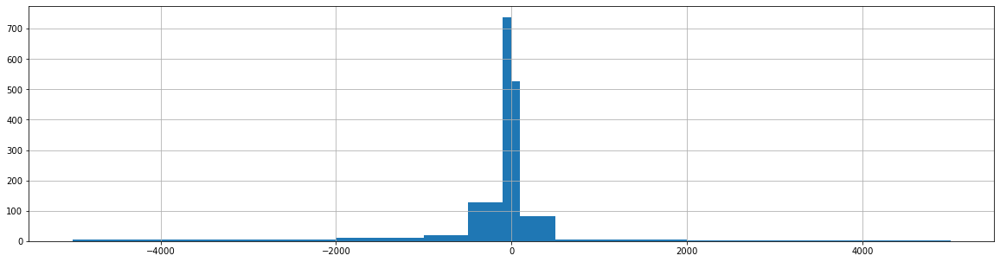

In [23]:
m_df['delta'].hist(bins=[-5000,-2000,-1000,-500,-100,0,100,500,1000,2000,5000], figsize=(20,5))

In [24]:
import networkx as nx
G=nx.MultiDiGraph()

In [25]:
in_df.head()

,Unnamed: 0,UserId,ExternalPickpackId,StoreId,StoreName,LocationId,TransactionId,OwnerSince,OwnerTill,ContainerId,ContainerType
0,0,3847d24c-7b3c-4908-81cd-11cd9f4b1d37,vytal_bYZ2emJy7RASNN,26b1bd7b-c684-4cb9-aa76-51cc94b4df70,Salam Box,3866638,ee2b5aa8-9aad-447d-a8a2-66258acb18d8,2021-09-04 11:12:20.545771+00:00,2021-09-06 14:37:49.963400+00:00,3347515e-eb3f-43ab-a55b-ab019c3b6997,1250ml Bowl
1,1,3847d24c-7b3c-4908-81cd-11cd9f4b1d37,vytal_bYZ2emJy7RASNN,26b1bd7b-c684-4cb9-aa76-51cc94b4df70,Salam Box,3866637,ee2b5aa8-9aad-447d-a8a2-66258acb18d8,2021-09-04 11:12:20.545771+00:00,2021-09-06 14:37:49.963400+00:00,919d2868-f154-46be-93c0-7f548d4416f0,1250ml Bowl
2,2,28421d4c-5213-44e5-a832-49f0b28c0e2a,vytal_q6VAEDli9i6zEK,afcd3cf4-bf64-4217-b192-6359fac0679a,Tiki Poke Bowl,3727671,f5afaa79-a767-4991-9c9d-1a5a4deed74c,2021-08-25 10:01:09.920476+00:00,2021-09-06 14:36:28.413267+00:00,aa5a5efa-4a96-4990-8f4b-f1fb96f0423f,Compartment Bowl
3,3,28421d4c-5213-44e5-a832-49f0b28c0e2a,vytal_q6VAEDli9i6zEK,afcd3cf4-bf64-4217-b192-6359fac0679a,Tiki Poke Bowl,3727670,f5afaa79-a767-4991-9c9d-1a5a4deed74c,2021-08-25 10:01:09.920476+00:00,2021-09-06 14:36:28.413267+00:00,175bde34-9e9b-4c39-8201-4953574688bd,1250ml Bowl
4,4,1fdf3e5c-7072-4c6e-b7ca-4c2bc53abb98,vytal_Uo1hXokqOiOz2F,825df884-f2cd-4c89-bf27-b63042035435,WDR Arkaden - Betriebskantine,3885031,f0294ada-73d6-430c-bad3-42a1e5ae66e7,2021-09-06 12:41:06.868894+00:00,2021-09-06 14:31:28.996050+00:00,5c9ed900-7098-42d1-a60e-428c97ded2c5,750ml Bowl


In [26]:
for ind, row in in_df.iterrows():
    
    G.add_edge(row["UserId"],row["StoreId"], date=row["OwnerTill"], container_id=row["ContainerId"],container_type=row["ContainerType"])
    G.nodes[row["StoreId"]]["node_type"]="partner"
    G.nodes[row["UserId"]]["node_type"]="consumer"

In [27]:
for ind, row in out_df.iterrows():
    G.add_edge(row["StoreId"], row["UserId"], date=row["OwnerSince"],  container_id=row["ContainerId"], container=row["ContainerType"])
    G.nodes[row["StoreId"]]["node_type"]="partner"
    G.nodes[row["UserId"]]["node_type"]="consumer"

In [28]:
len(G.edges)

3354649

In [31]:
degrees = {node:val for (node, val) in G.degree()}

In [35]:
for k,v in degrees.items():
    G.nodes[k]["degree"]=v

In [37]:
G.nodes(data=True)

NodeDataView({'3847d24c-7b3c-4908-81cd-11cd9f4b1d37': {'degree': 72}, '26b1bd7b-c684-4cb9-aa76-51cc94b4df70': {'degree': 3912}, '28421d4c-5213-44e5-a832-49f0b28c0e2a': {'degree': 4}, 'afcd3cf4-bf64-4217-b192-6359fac0679a': {'degree': 1505}, '1fdf3e5c-7072-4c6e-b7ca-4c2bc53abb98': {'degree': 6}, '825df884-f2cd-4c89-bf27-b63042035435': {'degree': 5133}, '5dc1a74c-4d9a-4019-b524-9d863ace0f80': {'degree': 22}, 'c79b123d-61f0-4d34-966f-622a1a302ee6': {'degree': 48}, '943c18bc-a6c7-483a-99c5-de95fe943976': {'degree': 20}, '19db94e3-3216-4d52-817f-9979560b0489': {'degree': 8}, 'e90327d3-274f-42fe-88fe-9bf50163c6ca': {'degree': 66}, '6c84486a-808d-4db6-97d9-f8f621de678b': {'degree': 26}, 'aaffa877-0f84-41bf-9f4c-a87d4ea7fbaa': {'degree': 2}, '2c62e8a8-640e-46f3-b6b4-da2abf639404': {'degree': 58}, '95a71eef-5e6f-4900-970e-cf725d545341': {'degree': 143}, '4e47b46f-6223-46d0-bb07-b55099a80d86': {'degree': 29}, '22a6e37d-ee57-4cb5-b8c5-7e9035ca5dd3': {'degree': 44}, 'cac65886-99f9-4ed4-85ba-fe4302